In [19]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [20]:
# Install Ultralytics library
!pip install ultralytics


In [21]:
# Import necessary libraries
import os
import cv2
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
import shutil
from shutil import copyfile
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html='jshtml')
from PIL import Image

# Import YOLOv8 from Ultralytics
import ultralytics
from ultralytics import YOLO

# Check the installation of Ultralytics
ultralytics.checks()

Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 28.3/78.2 GB disk)


In [22]:


# Define paths for train, valid, and test datasets

train_path='/content/drive/MyDrive/ts4classes/train'
valid_path='/content/drive/MyDrive/ts4classes/validation'
test_path='/content/drive/MyDrive/ts4classes/test'

In [23]:

print(len(os.listdir(train_path)))

1356


In [24]:

print(len(os.listdir(valid_path)))

296


In [25]:

print(len(os.listdir(test_path)))

148


In [26]:
# Create a YAML file to describe the dataset configuration
import yaml

data_yaml = dict(
    train ='/content/drive/MyDrive/ts4classes/train',
    val ='/content/drive/MyDrive/ts4classes/validation',
    test='/content/drive/MyDrive/ts4classes/test',
    nc =4,
    names =['prohibitor','danger','mandatory','other']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)

# Display the content of the data.yaml file
%cat data.yaml

{names: [prohibitor, danger, mandatory, other], nc: 4, test: /content/drive/MyDrive/ts4classes/test,
  train: /content/drive/MyDrive/ts4classes/train, val: /content/drive/MyDrive/ts4classes/validation}


In [27]:
names =['prohibitor','danger','mandatory','other']
M=list(range(len(names)))
class_map=dict(zip(M,names))

In [28]:
# Load YOLOv8 model
model = YOLO("yolov8x.pt")


In [29]:
# Train the YOLOv8 model using the specified configuration file and parameters
#!yolo task=detect mode=train model=yolov8x.pt data=data.yaml epochs=12

model.train(data="/content/data.yaml", epochs=30)  # train the model
metrics = model.val()

Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=T

train: Scanning /content/drive/MyDrive/ts4classes/train... 678 images, 159 backgrounds, 0 corrupt: 100%|██████████| 678/678 [00:51<00:00, 13.05it/s]

train: WARNING ⚠️ /content/drive/MyDrive/ts4classes/train/00340.jpg: 1 duplicate labels removed


train: New cache created: /content/drive/MyDrive/ts4classes/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/ts4classes/validation... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:07<00:00, 18.94it/s]


val: New cache created: /content/drive/MyDrive/ts4classes/validation.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      14.3G     0.9985      3.014     0.8754         19        640: 100%|██████████| 43/43 [00:53<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.36it/s]

                   all        148        257      0.119      0.568     0.0874     0.0637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      14.8G     0.9945      1.079     0.8588         14        640: 100%|██████████| 43/43 [00:52<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.23it/s]

                   all        148        257   0.000242    0.00219    0.00011   7.97e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      14.8G      1.071     0.9634     0.8763         14        640: 100%|██████████| 43/43 [00:51<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        148        257      0.244       0.02     0.0224     0.0137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      14.8G      1.108      1.144     0.8998         13        640: 100%|██████████| 43/43 [00:51<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        148        257      0.244       0.02     0.0224     0.0137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      14.8G       1.03     0.8786     0.8667          7        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        148        257      0.943      0.723      0.784       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      14.8G     0.9957     0.7717     0.8665         12        640: 100%|██████████| 43/43 [00:51<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.36it/s]

                   all        148        257      0.945       0.83      0.918      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      14.8G     0.9488     0.7338     0.8463          7        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.46it/s]

                   all        148        257      0.939      0.674      0.735      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      14.8G     0.9068     0.7001     0.8483         13        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]

                   all        148        257      0.929      0.878      0.933      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      14.8G     0.8558     0.6133     0.8369         12        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.34it/s]

                   all        148        257      0.955      0.876      0.949      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      14.8G     0.8968     0.6036     0.8477         14        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.32it/s]

                   all        148        257      0.942      0.867      0.925      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      14.8G     0.8592     0.5821     0.8289         23        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        148        257      0.924      0.891      0.946       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      14.8G     0.8217     0.5866     0.8226         13        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.22it/s]

                   all        148        257      0.943      0.926      0.969      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      14.8G     0.7675      0.524     0.8372         12        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        148        257      0.984      0.901      0.968      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      14.8G     0.7673     0.5187     0.8207         15        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]

                   all        148        257      0.935      0.951       0.97      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      14.8G     0.7417     0.4768     0.8218          8        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        148        257       0.97      0.918      0.967      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      14.8G     0.7099     0.4484     0.8216         10        640: 100%|██████████| 43/43 [00:51<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.44it/s]

                   all        148        257      0.976      0.913      0.964      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      14.8G     0.7383     0.4839     0.8186         13        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.52it/s]

                   all        148        257      0.969      0.917      0.961      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      14.8G     0.6964     0.4504     0.8077         16        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.28it/s]

                   all        148        257      0.979      0.931      0.971      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      14.8G     0.7051     0.4327     0.8149         13        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.35it/s]

                   all        148        257      0.935       0.94      0.971      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      14.8G      0.685     0.4144     0.8126         16        640: 100%|██████████| 43/43 [00:50<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.49it/s]

                   all        148        257      0.962       0.92      0.974      0.716


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      14.8G     0.7142     0.4262     0.8123         10        640: 100%|██████████| 43/43 [00:52<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.41it/s]

                   all        148        257      0.962      0.925      0.964      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      14.8G     0.6951     0.3966     0.8136          5        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        148        257      0.943      0.926      0.958      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      14.8G     0.6492     0.3959      0.806          3        640: 100%|██████████| 43/43 [00:50<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.42it/s]

                   all        148        257      0.956      0.935      0.972      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      14.8G     0.6511      0.398     0.8092          5        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]

                   all        148        257      0.962      0.957       0.98       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      14.8G     0.6225     0.3766     0.7963          5        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.31it/s]

                   all        148        257      0.967      0.939       0.98      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      14.8G     0.6322     0.3656     0.8057          7        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.56it/s]

                   all        148        257      0.959      0.955      0.983      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      14.8G       0.59      0.353     0.8017          6        640: 100%|██████████| 43/43 [00:50<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]

                   all        148        257      0.942      0.978      0.983      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      14.8G      0.579     0.3441     0.7795          9        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.47it/s]

                   all        148        257      0.954      0.948      0.981      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      14.8G     0.5744     0.3446     0.7976          9        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.50it/s]

                   all        148        257      0.947       0.98      0.986      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      14.8G     0.5654      0.327     0.7948          6        640: 100%|██████████| 43/43 [00:50<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.45it/s]

                   all        148        257      0.978      0.952      0.984      0.842



30 epochs completed in 0.532 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 136.7MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68127420 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:05<00:00,  1.12s/it]


                   all        148        257      0.978      0.953      0.985      0.842
            prohibitor        148        114       0.99      0.991      0.995      0.886
                danger        148         46      0.963          1      0.987      0.838
             mandatory        148         32       0.96      0.938      0.982      0.839
                 other        148         65          1      0.881      0.974      0.805
Speed: 0.2ms preprocess, 17.1ms inference, 0.0ms loss, 4.7ms postprocess per image
Results saved to runs/detect/train2
Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68127420 parameters, 0 gradients, 257.4 GFLOPs


val: Scanning /content/drive/MyDrive/ts4classes/validation.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:10<00:00,  1.01s/it]


                   all        148        257      0.978      0.953      0.984       0.85
            prohibitor        148        114       0.99      0.991      0.995       0.88
                danger        148         46      0.963          1      0.987      0.849
             mandatory        148         32       0.96      0.938      0.981      0.849
                 other        148         65          1      0.881      0.974      0.819
Speed: 0.3ms preprocess, 38.9ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/train22


In [30]:
# Collect paths of the detected images in the training phase
paths2=[]
for dirname, _, filenames in os.walk('/content/runs/detect/train2'):
    for filename in filenames:
        if filename[-4:]=='.jpg':
            paths2+=[(os.path.join(dirname, filename))]
paths2=sorted(paths2)

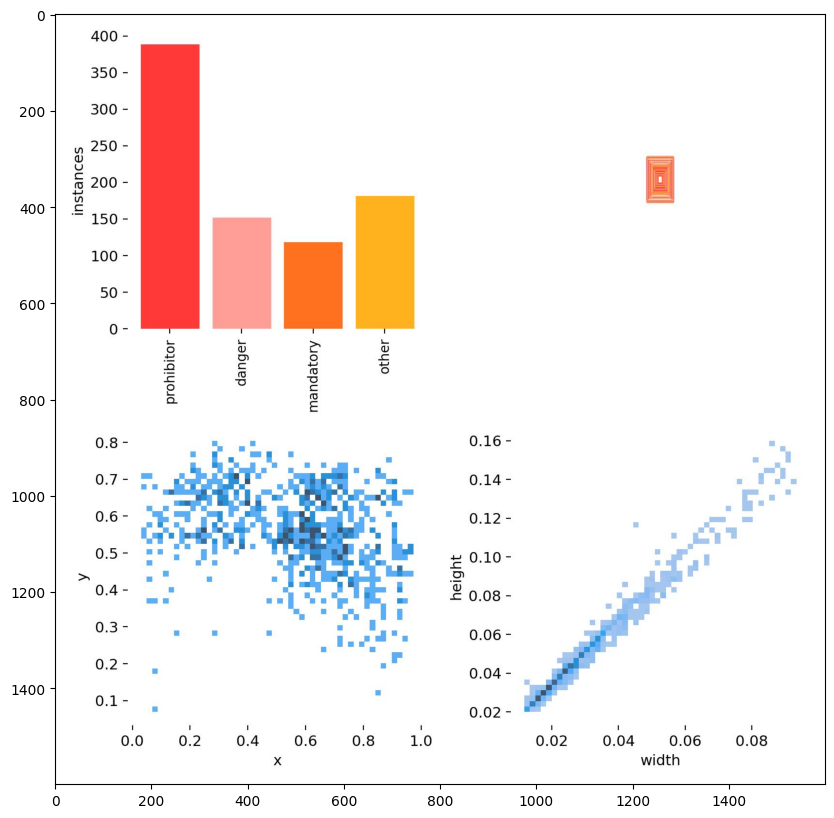

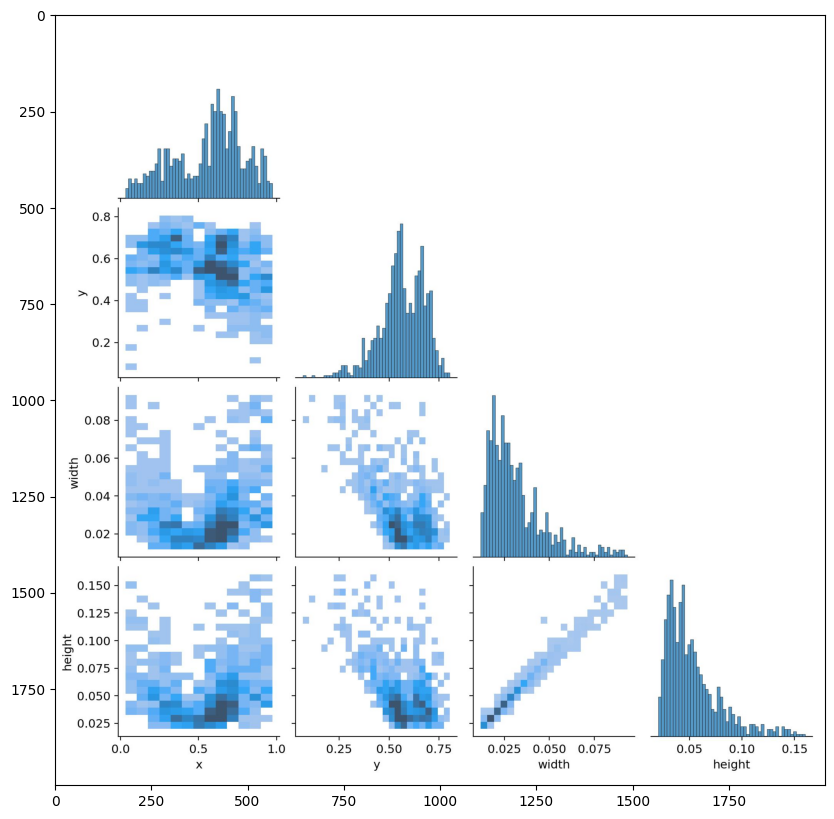

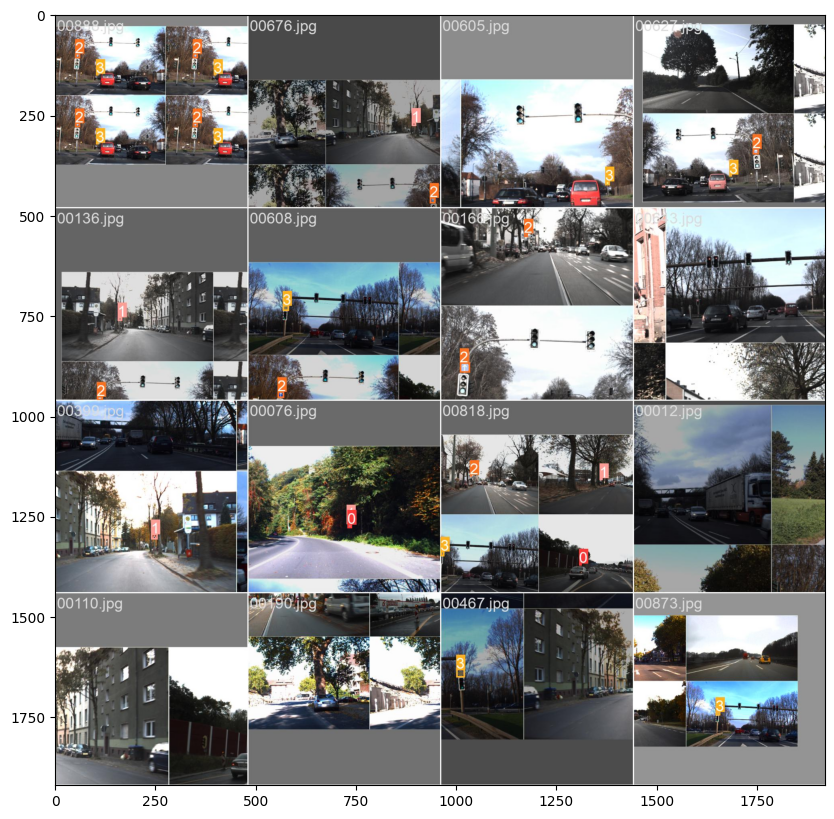

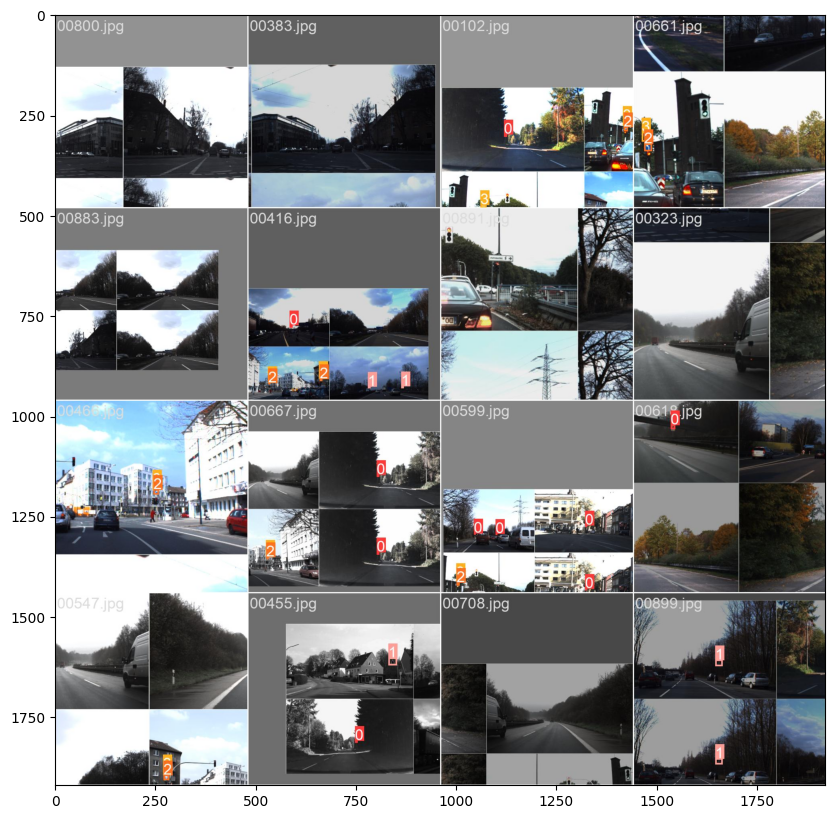

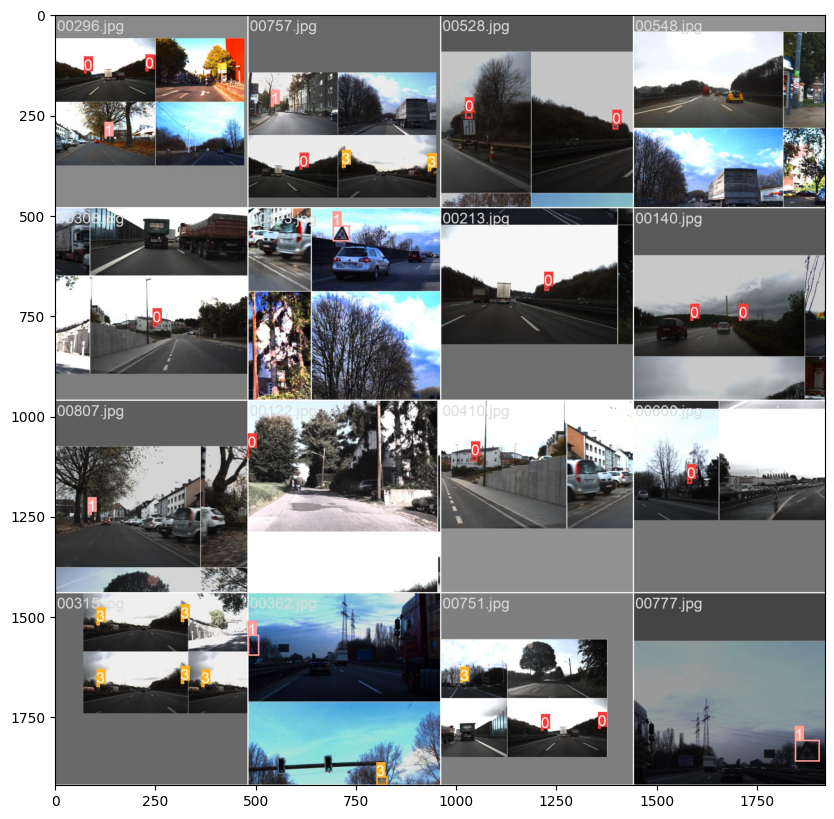

...

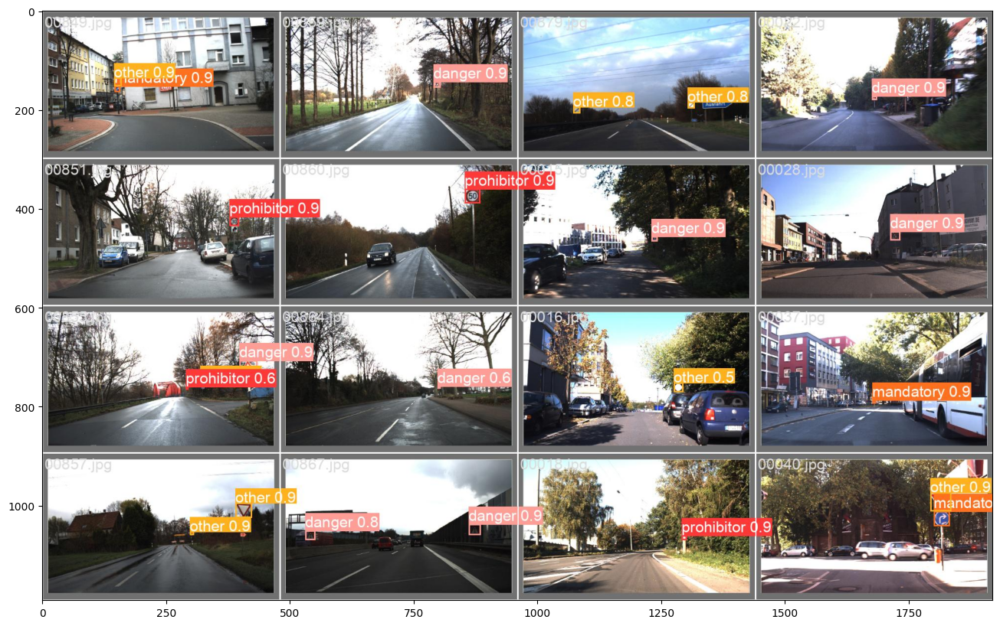

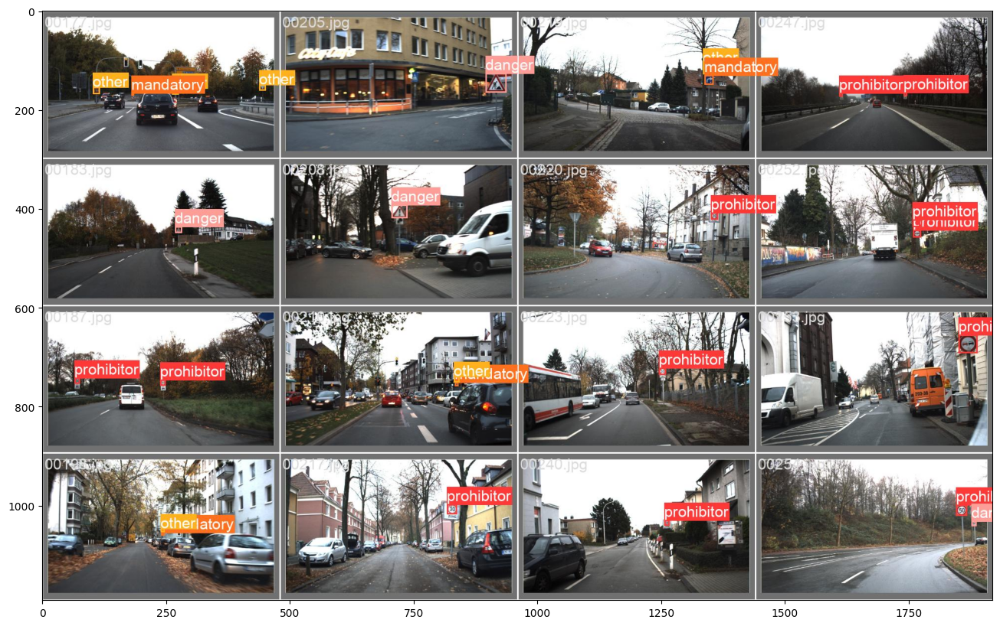

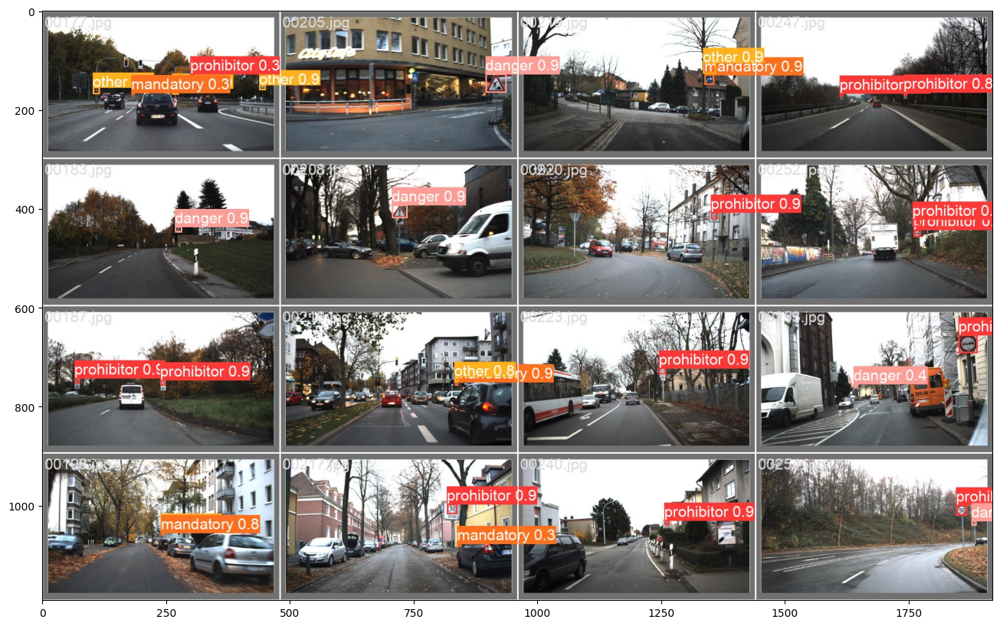

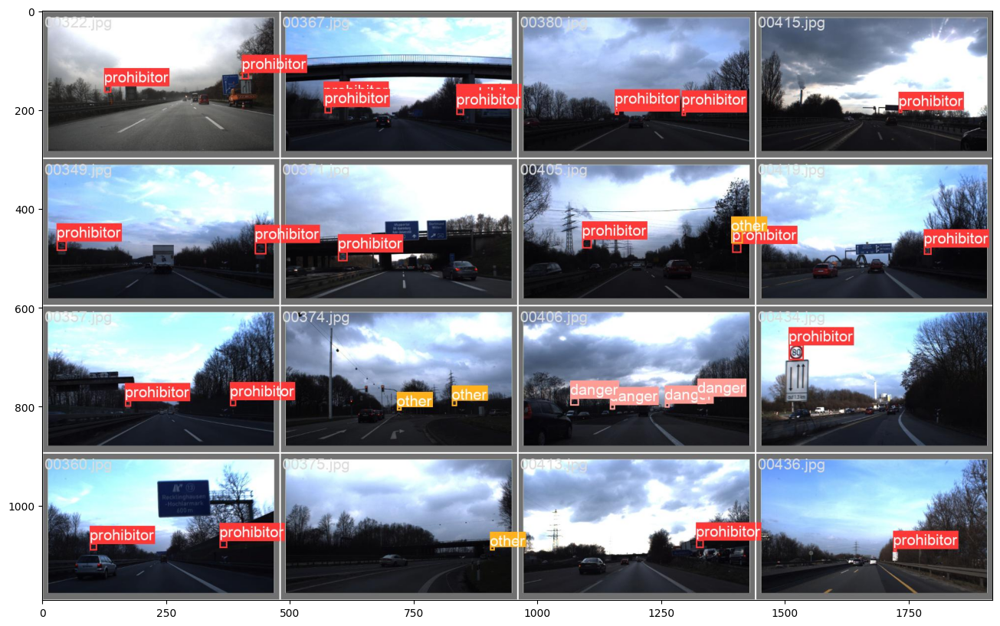

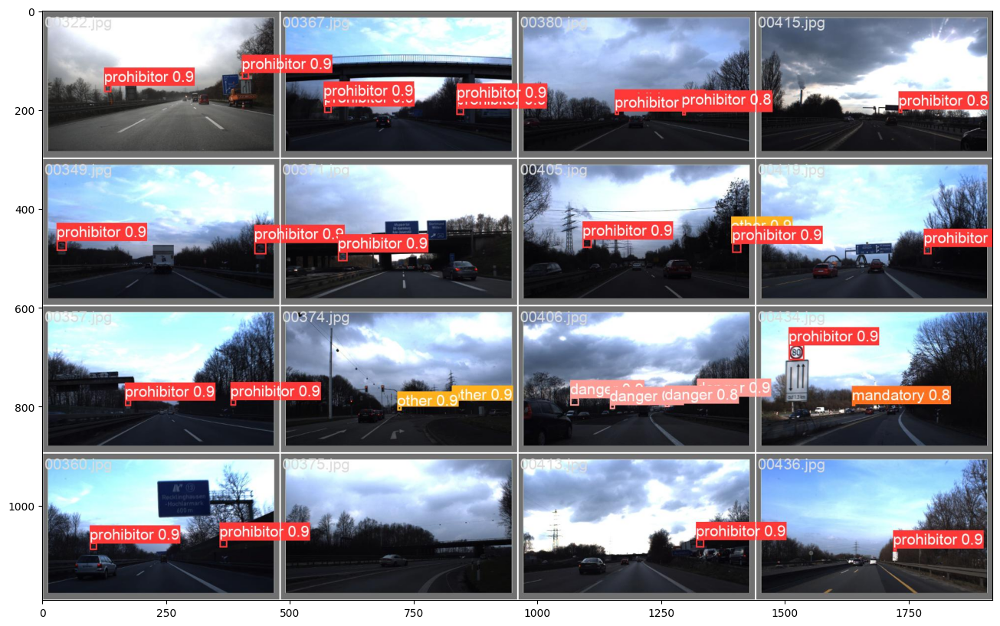

In [31]:
# Display the detected images
for path in paths2:
    image = Image.open(path)
    image=np.array(image)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()

In [32]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
print(metrics.box.map)   # map50-95
print(metrics.box.map50)  # map50

Ultralytics YOLOv8.1.26 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/drive/MyDrive/ts4classes/validation.cache... 148 images, 0 backgrounds, 0 corrupt: 100%|██████████| 148/148 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:09<00:00,  1.06it/s]


                   all        148        257      0.978      0.953      0.984       0.85
            prohibitor        148        114       0.99      0.991      0.995       0.88
                danger        148         46      0.963          1      0.987      0.849
             mandatory        148         32       0.96      0.938      0.981      0.849
                 other        148         65          1      0.881      0.974      0.819
Speed: 0.4ms preprocess, 37.1ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/train23
0.8496613052795606
0.9843920095891938
